In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input

# Load model directly from Colab content folder
model = tf.keras.models.load_model('/content/oscc_model_rebuilt.keras')
print("Model loaded successfully!")
model.summary()

Model loaded successfully!


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adamax', because it has 690 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 1536)           │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 1536)           │         6,144 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       393,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,370,247 (127.30 MB)

 Trainable params: 11,093,290 (42.32 MB)

 Non-trainable params: 90,375 (353.03 KB)

 Optimizer params: 22,186,582 (84.64 MB)

In [2]:
def load_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array), img

img_array_oscc, original_img_oscc = load_image('/content/OSCC_100x_206.jpg')
img_array_normal, original_img_normal = load_image('/content/Normal_100x_41.jpg')

print("Both images loaded successfully!")

Both images loaded successfully!


OSCC Image → Prediction: OSCC (84.9% confidence)


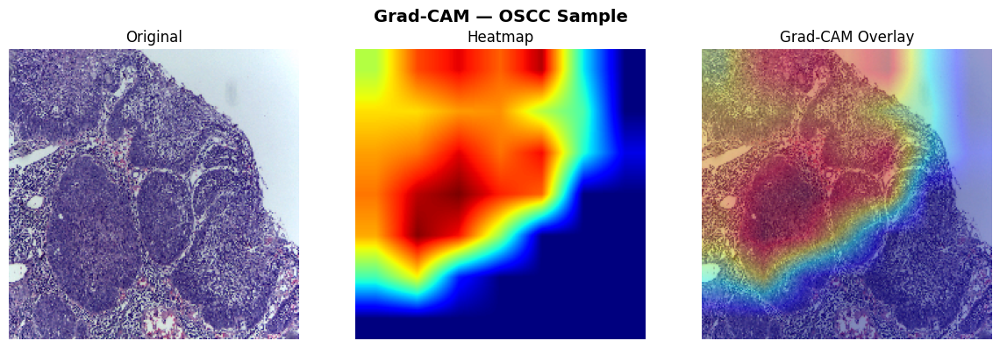

Normal Image → Prediction: Normal (84.1% confidence)


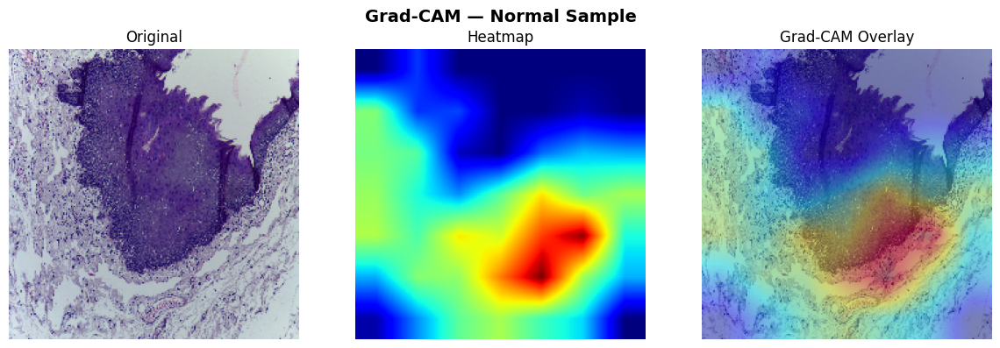

In [13]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name="top_conv"):
    base_model = model.get_layer('efficientnetb3')

    # Build two sub-models: one up to top_conv, one from top_conv to end
    feature_extractor = tf.keras.Model(
        inputs=base_model.input,
        outputs=[
            base_model.get_layer("top_conv").output,   # for gradients
            base_model.output                           # pooled output for head
        ]
    )

    img_tensor = tf.cast(img_array, tf.float32)

    with tf.GradientTape() as tape:
        conv_outputs, pooled_output = feature_extractor(img_tensor, training=False)
        tape.watch(conv_outputs)

        # Pass pooled output through the sequential head
        x = pooled_output
        for layer in model.layers[1:]:  # skip efficientnetb3
            x = layer(x, training=False)
        predictions = x

        pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = conv_outputs[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy(), predictions.numpy()

def overlay_gradcam(original_img, heatmap, title, alpha=0.4):
    img = np.array(original_img)
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_colored = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed = cv2.addWeighted(img, 1 - alpha, heatmap_colored, alpha, 0)

    plt.figure(figsize=(12, 4))
    plt.suptitle(title, fontsize=14, fontweight='bold')
    plt.subplot(1, 3, 1); plt.imshow(img); plt.title("Original"); plt.axis('off')
    plt.subplot(1, 3, 2); plt.imshow(heatmap_resized, cmap='jet'); plt.title("Heatmap"); plt.axis('off')
    plt.subplot(1, 3, 3); plt.imshow(superimposed); plt.title("Grad-CAM Overlay"); plt.axis('off')
    plt.tight_layout(); plt.show()

class_names = ['Normal', 'OSCC']  # adjust if your class order is different

# OSCC Image
heatmap_oscc, pred_oscc = make_gradcam_heatmap(img_array_oscc, model)
print(f"OSCC Image → Prediction: {class_names[np.argmax(pred_oscc)]} ({np.max(pred_oscc)*100:.1f}% confidence)")
overlay_gradcam(original_img_oscc, heatmap_oscc, title="Grad-CAM — OSCC Sample")

# Normal Image
heatmap_normal, pred_normal = make_gradcam_heatmap(img_array_normal, model)
print(f"Normal Image → Prediction: {class_names[np.argmax(pred_normal)]} ({np.max(pred_normal)*100:.1f}% confidence)")
overlay_gradcam(original_img_normal, heatmap_normal, title="Grad-CAM — Normal Sample")

  0%|          | 0/1000 [00:00<?, ?it/s]

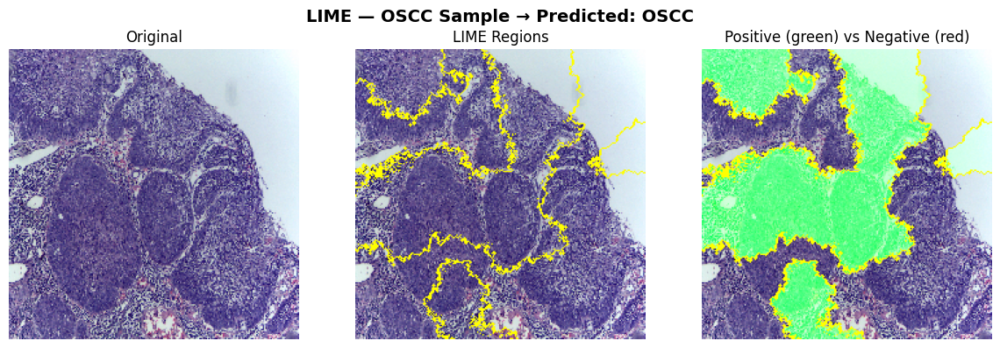

  0%|          | 0/1000 [00:00<?, ?it/s]

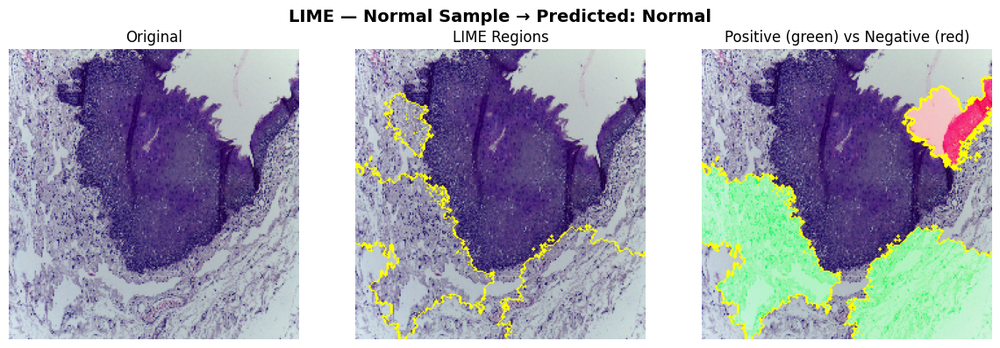

In [15]:
from lime import lime_image
from skimage.segmentation import mark_boundaries

def run_lime(img_array, original_img, model, class_names, title):
    explainer = lime_image.LimeImageExplainer()

    # LIME needs a predict function that takes (N, H, W, 3) and returns (N, num_classes)
    def predict_fn(images):
        images = tf.cast(images, tf.float32)
        images = preprocess_input(images)
        return model.predict(images, verbose=0)

    # Run LIME
    explanation = explainer.explain_instance(
        np.array(original_img),         # raw uint8 image
        predict_fn,
        top_labels=2,
        hide_color=0,
        num_samples=1000,
        random_seed=42
    )

    # Get explanation for the top predicted label
    top_label = explanation.top_labels[0]
    temp, mask = explanation.get_image_and_mask(
        top_label,
        positive_only=True,
        num_features=10,
        hide_rest=False
    )

    # Plot
    plt.figure(figsize=(12, 4))
    plt.suptitle(f"LIME — {title} → Predicted: {class_names[top_label]}",
                 fontsize=14, fontweight='bold')

    plt.subplot(1, 3, 1)
    plt.imshow(original_img); plt.title("Original"); plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(mark_boundaries(temp, mask)); plt.title("LIME Regions"); plt.axis('off')

    plt.subplot(1, 3, 3)
    temp2, mask2 = explanation.get_image_and_mask(
        top_label,
        positive_only=False,
        num_features=10,
        hide_rest=False
    )
    plt.imshow(mark_boundaries(temp2, mask2))
    plt.title("Positive (green) vs Negative (red)"); plt.axis('off')

    plt.tight_layout()
    plt.show()

# Run LIME on both images
run_lime(img_array_oscc, original_img_oscc, model, class_names, title="OSCC Sample")
run_lime(img_array_normal, original_img_normal, model, class_names, title="Normal Sample")

In [16]:
from google.colab import files
import zipfile
import os

# Upload a zip file containing your test images
# Zip structure should be:
#   test_images.zip
#       OSCC/
#           image1.jpg
#           image2.jpg
#       Normal/
#           image1.jpg
#           image2.jpg

uploaded = files.upload()  # this will open a file picker

# Extract the zip
zip_filename = list(uploaded.keys())[0]
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall('/content/test_images')

print("Files extracted! Structure:")
for root, dirs, files_list in os.walk('/content/test_images'):
    for f in files_list:
        print(os.path.join(root, f))

Saving Normal.zip to Normal.zip
Saving OSCC.zip to OSCC.zip
Files extracted! Structure:
/content/test_images/Normal/Normal_100x_72.jpg
/content/test_images/Normal/Normal_400x_65.jpg
/content/test_images/Normal/Normal_100x_12.jpg
/content/test_images/Normal/Normal_100x_83.jpg
/content/test_images/Normal/Normal_400x_74.jpg
/content/test_images/Normal/Normal_400x_88.jpg
/content/test_images/Normal/Normal_400x_96.jpg
/content/test_images/Normal/Normal_400x_197.jpg
/content/test_images/Normal/Normal_400x_152.jpg
/content/test_images/Normal/Normal_400x_105.jpg
/content/test_images/Normal/Normal_100x_41.jpg
/content/test_images/Normal/Normal_400x_12.jpg
/content/test_images/Normal/Normal_100x_22.jpg
/content/test_images/Normal/Normal_400x_106.jpg
/content/test_images/Normal/Normal_400x_43.jpg
/content/test_images/Normal/Normal_400x_162.jpg
/content/test_images/Normal/Normal_400x_130.jpg
/content/test_images/Normal/Normal_100x_25.jpg
/content/test_images/Normal/Normal_400x_124.jpg
/content/tes

Folder contents:
  Normal
  OSCC


Processing 5 images from: Normal
[WRONG] Normal_100x_72.jpg -> Predicted: OSCC (84.1%)


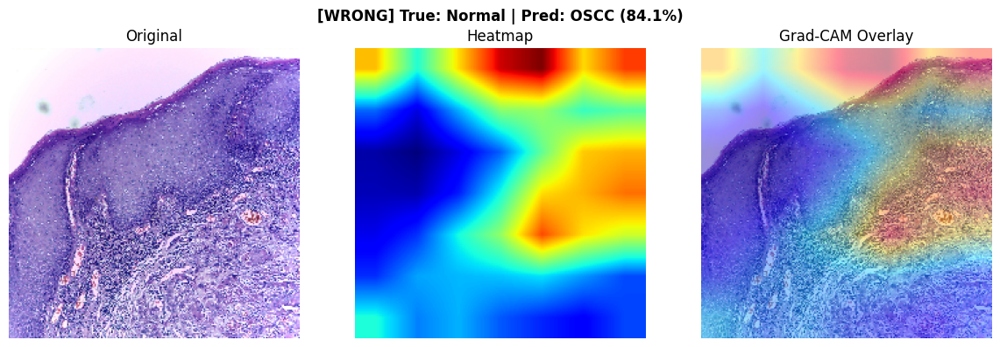

[CORRECT] Normal_400x_65.jpg -> Predicted: Normal (90.1%)


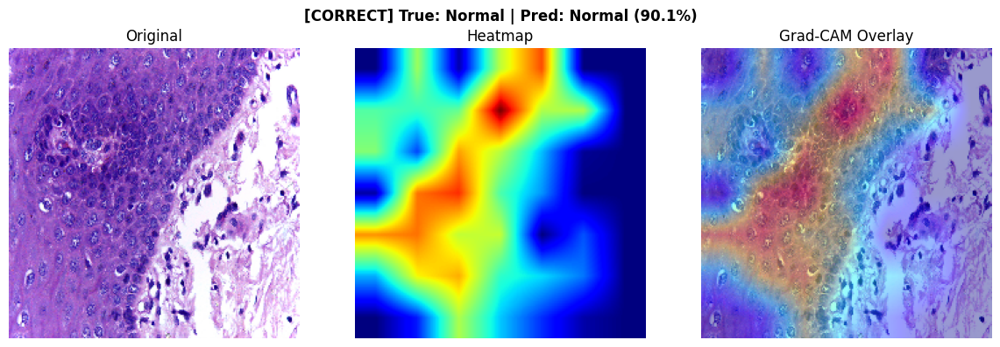

[WRONG] Normal_100x_12.jpg -> Predicted: OSCC (60.7%)


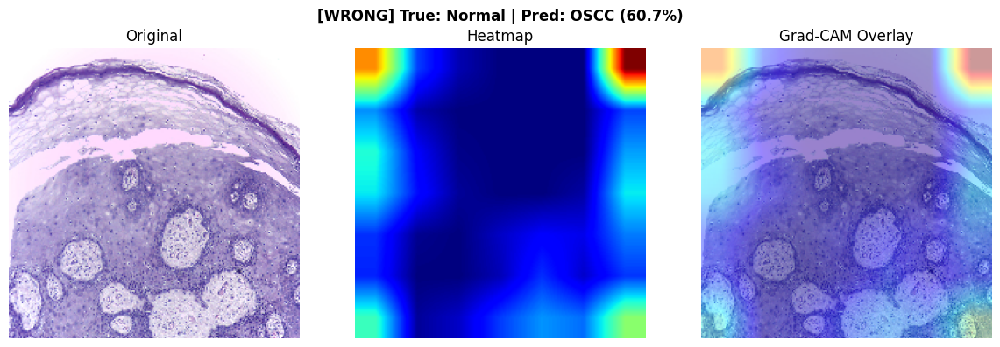

[WRONG] Normal_100x_83.jpg -> Predicted: OSCC (75.1%)


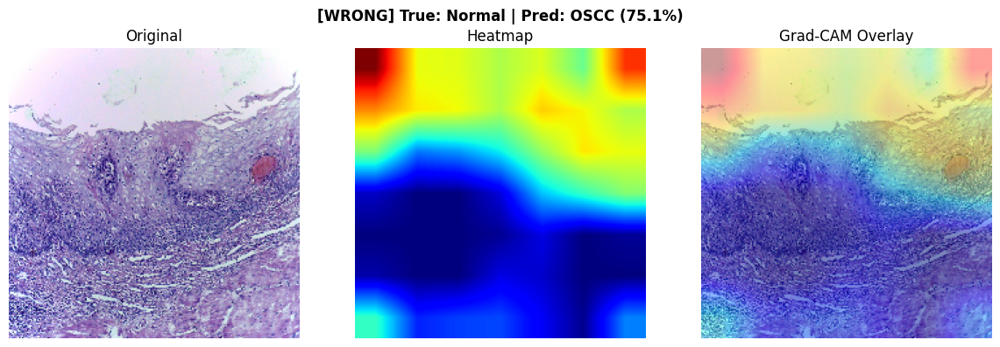

[CORRECT] Normal_400x_74.jpg -> Predicted: Normal (87.5%)


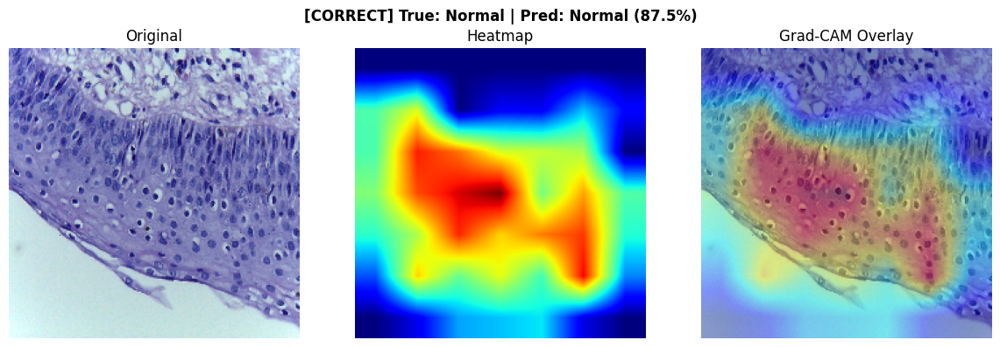


Processing 5 images from: OSCC
[CORRECT] OSCC_400x_211.jpg -> Predicted: OSCC (87.1%)


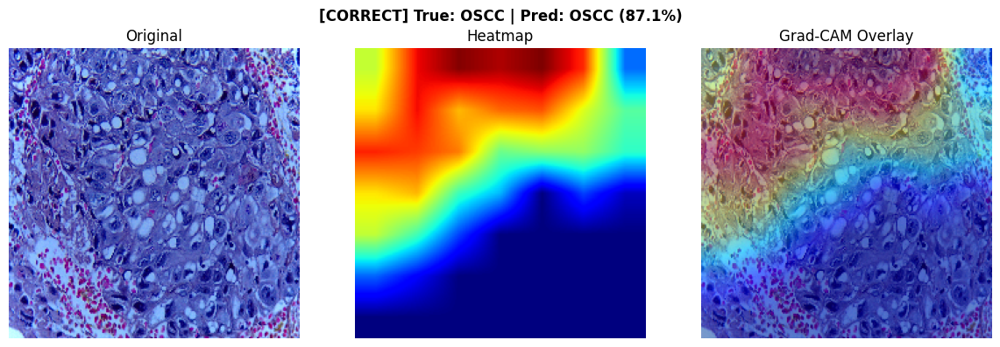

[CORRECT] OSCC_400x_292.jpg -> Predicted: OSCC (82.5%)


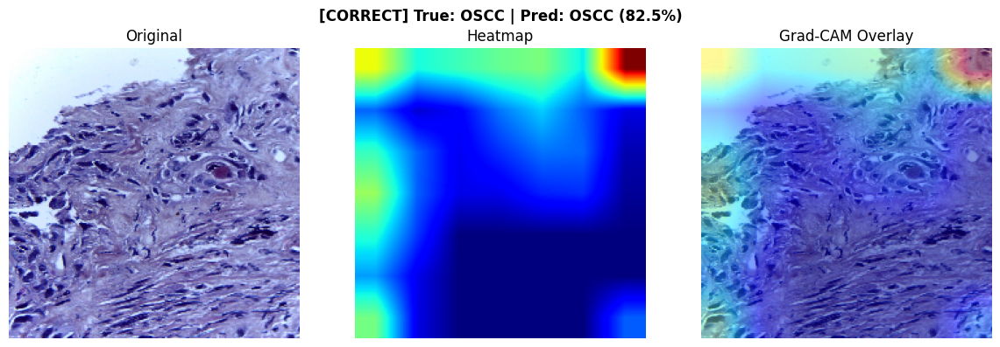

[CORRECT] OSCC_400x_440.jpg -> Predicted: OSCC (77.6%)


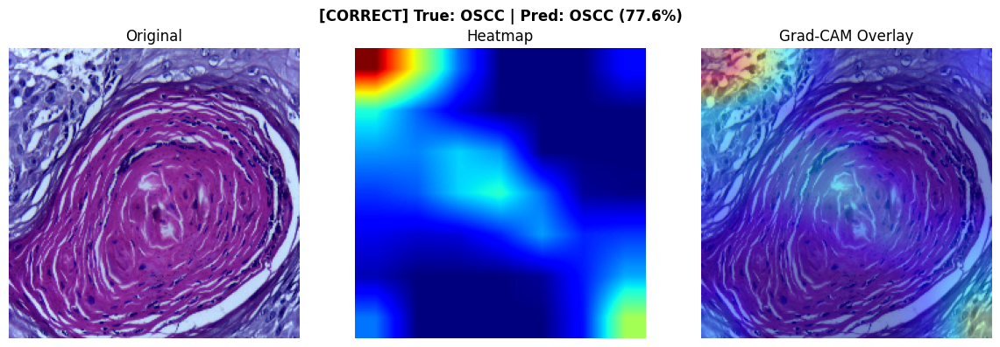

[CORRECT] OSCC_400x_163.jpg -> Predicted: OSCC (86.2%)


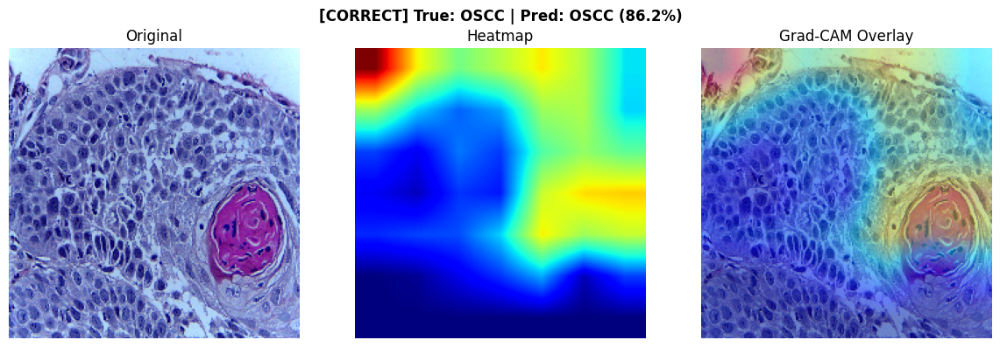

[CORRECT] OSCC_400x_410.jpg -> Predicted: OSCC (88.8%)


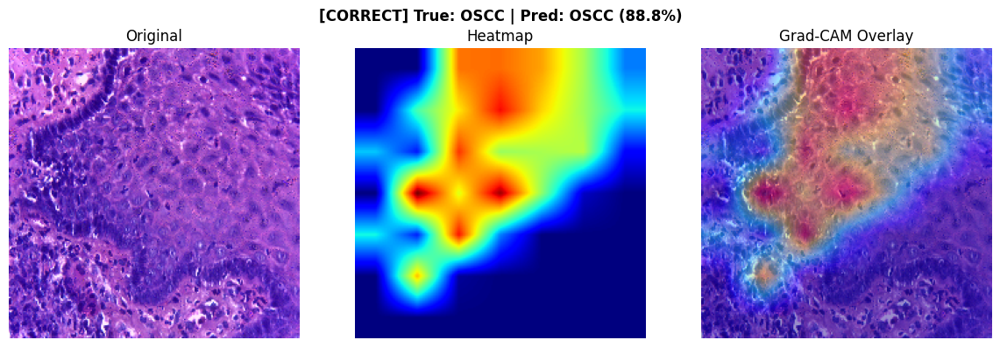


BATCH SUMMARY
Total Images   : 10
Correct        : 7
Incorrect      : 3
Batch Accuracy : 70.0%

Per-class breakdown:
  Normal: 2/5 correct
  OSCC: 5/5 correct

Results saved to: /content/gradcam_results


In [22]:
def batch_gradcam(test_folder, model, class_names, num_images=5, save_output=True):
    output_dir = '/content/gradcam_results'
    os.makedirs(output_dir, exist_ok=True)

    results = []

    # Debug: show what's actually inside test_folder
    print("Folder contents:")
    for item in os.listdir(test_folder):
        print(f"  {item}")
    print()

    for class_name in class_names:
        class_folder = os.path.join(test_folder, class_name)
        if not os.path.exists(class_folder):
            print(f"[SKIPPED] Folder not found: {class_folder}")
            continue

        image_files = list(Path(class_folder).glob('*.jpg')) + \
                      list(Path(class_folder).glob('*.png'))
        image_files = image_files[:num_images]

        print(f"\n{'='*50}")
        print(f"Processing {len(image_files)} images from: {class_name}")
        print(f"{'='*50}")

        for img_path in image_files:
            img_array, original_img = load_image(str(img_path))
            heatmap, predictions = make_gradcam_heatmap(img_array, model)

            pred_label = class_names[np.argmax(predictions)]
            confidence = np.max(predictions) * 100
            true_label = class_name
            status = "[CORRECT]" if pred_label == true_label else "[WRONG]"

            print(f"{status} {img_path.name} -> Predicted: {pred_label} ({confidence:.1f}%)")
            results.append((img_path.name, true_label, pred_label, confidence))

            img_np = np.array(original_img)
            heatmap_resized = cv2.resize(heatmap, (img_np.shape[1], img_np.shape[0]))
            heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
            heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
            superimposed = cv2.addWeighted(img_np, 0.6, heatmap_colored, 0.4, 0)

            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            fig.suptitle(
                f"{status} True: {true_label} | Pred: {pred_label} ({confidence:.1f}%)",
                fontsize=12, fontweight='bold'
            )
            axes[0].imshow(img_np); axes[0].set_title("Original"); axes[0].axis('off')
            axes[1].imshow(heatmap_resized, cmap='jet'); axes[1].set_title("Heatmap"); axes[1].axis('off')
            axes[2].imshow(superimposed); axes[2].set_title("Grad-CAM Overlay"); axes[2].axis('off')

            plt.tight_layout()
            if save_output:
                save_path = os.path.join(output_dir, f"{true_label}_{img_path.name}")
                plt.savefig(save_path, bbox_inches='tight', dpi=150)
            plt.show()
            plt.close()

    # Summary
    print(f"\n{'='*50}")
    print("BATCH SUMMARY")
    print(f"{'='*50}")
    if len(results) == 0:
        print("No images were processed. Check folder path and structure.")
    else:
        correct_count = sum(1 for r in results if r[1] == r[2])
        print(f"Total Images   : {len(results)}")
        print(f"Correct        : {correct_count}")
        print(f"Incorrect      : {len(results) - correct_count}")
        print(f"Batch Accuracy : {correct_count/len(results)*100:.1f}%")

        # Breakdown by class
        print(f"\nPer-class breakdown:")
        for class_name in class_names:
            class_results = [r for r in results if r[1] == class_name]
            if class_results:
                class_correct = sum(1 for r in class_results if r[1] == r[2])
                print(f"  {class_name}: {class_correct}/{len(class_results)} correct")

        print(f"\nResults saved to: {output_dir}")

    return results

results = batch_gradcam(
    test_folder='/content/test_images',
    model=model,
    class_names=class_names,
    num_images=5,
    save_output=True
)

In [23]:
# Save both model formats
model.save('/content/drive/MyDrive/dataset/oscc_model_final.keras')  # Keras 3 — recommended
model.save('/content/drive/MyDrive/dataset/oscc_model_final.h5')     # Legacy — for compatibility
print("Both model formats saved to Google Drive!")

Both model formats saved to Google Drive!
